In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install git+https://github.com/umang-singhal/pydom.git

  Cloning https://github.com/umang-singhal/pydom.git to /tmp/pip-req-build-doys039m
  Running command git clone -q https://github.com/umang-singhal/pydom.git /tmp/pip-req-build-doys039m
  Created wheel for pydom: filename=pydom-0.1-cp36-none-any.whl size=17989 sha256=5391147f7f392ad69e2452cfe40442e45d31e6b47744a04020e59a355a88c0d5
  Stored in directory: /tmp/pip-ephem-wheel-cache-ig1j8av_/wheels/4b/df/5b/1f7acae7f96c0b8fce3f2e4640100f7a297eab816f17bdb358
Successfully built pydom


In [ ]:
!pip install --upgrade opencv-python

     |████████████████████████████████| 49.5MB 98kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30


In [ ]:
!pip install -U scikit-image

     |████████████████████████████████| 12.4MB 314kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scikit-image 0.16.2
    Uninstalling scikit-image-0.16.2:
      Successfully uninstalled scikit-image-0.16.2


In [ ]:
!pip3 install pyfda -U

     |████████████████████████████████| 460kB 2.8MB/s 
     |████████████████████████████████| 71.6MB 62kB/s 
     |████████████████████████████████| 133kB 22.8MB/s 
     |████████████████████████████████| 286kB 38.3MB/s 
  Created wheel for pyfda: filename=pyfda-0.4.0-cp36-none-any.whl size=533211 sha256=07dde3edc852a11ed350745e0fb6a45a9e3f10a21612a902d0c840d3b2494dc0
  Stored in directory: /root/.cache/pip/wheels/50/f0/f8/d1a73aa9f80443391ba4a2bb49926803536db56dd3992777a5
  Created wheel for migen: filename=migen-0.9.2-cp36-none-any.whl size=179351 sha256=bea07bb31efd4488586fe7b30f5bfc4969860fb3c5fe6d70b9feb5b9ce8b2be6
  Stored in directory: /root/.cache/pip/wheels/ce/4e/57/78882a8e5b1f093187a86d22a714c9b4cc134dc38ac0957674
Successfully built pyfda migen


## Read Image


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

PATH = "drive/My Drive/PY/2020_Projects/ImgAnalysis/"
FILE = "PenguinNoise(1).bmp"
FILE_orig = "PenguinOriginal(1).bmp"


img = cv2.imread(os.path.join(PATH,FILE), cv2.IMREAD_GRAYSCALE).astype("float")
img_orig = cv2.imread(os.path.join(PATH,FILE_orig), cv2.IMREAD_GRAYSCALE).astype("float")

print(img.shape,img_orig.shape)

(342, 512) (342, 512)


In [ ]:
# No reference quality - sharpness
from dom import DOM
iqa = DOM()
score1 = iqa.get_sharpness(img.astype('uint8'))
score2 = iqa.get_sharpness(img_orig.astype('uint8'))
print(score1, score2)

1.130340009677289 0.857711518054563


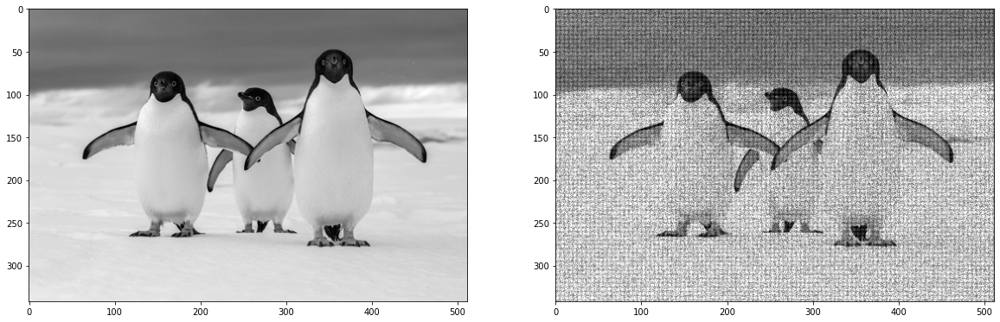

In [ ]:
plt.figure(figsize=(20, 10))
plt.subplot(121),plt.imshow(img_orig, cmap="gray")
plt.subplot(122),plt.imshow(img, cmap="gray")
plt.show()

In [ ]:
img_orig.min(),img_orig.max()

(0, 253)

## Try FFT


(<matplotlib.axes._subplots.AxesSubplot at 0x7f42acf92cc0>,
 <matplotlib.image.AxesImage at 0x7f42acf004a8>)

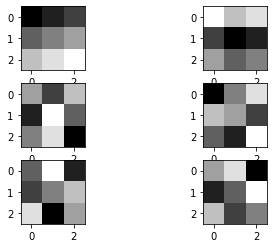

In [ ]:
t1 = [[1,2,3],[4,5,6],[7,8,9]]
t2 = [[6,3,7],[2,9,4],[5,8,1]]
t3 = [[4,9,2],[3,5,7],[8,1,6]]
plt.subplot(321),plt.imshow(t1,cmap='gray')
plt.subplot(322),plt.imshow(np.fft.fftshift(t1),cmap='gray')
plt.subplot(323),plt.imshow(t2,cmap='gray')
plt.subplot(324),plt.imshow(np.fft.fftshift(t2),cmap='gray')
plt.subplot(325),plt.imshow(t3,cmap='gray')
plt.subplot(326),plt.imshow(np.fft.fftshift(t3),cmap='gray')

In [ ]:
test = [[1,2,3,2,1],[1,2,3,2,1],[3,2,1,2,3]]
np.fft.fftshift(test)

array([[2, 3, 3, 2, 1],
       [2, 1, 1, 2, 3],
       [2, 1, 1, 2, 3]])

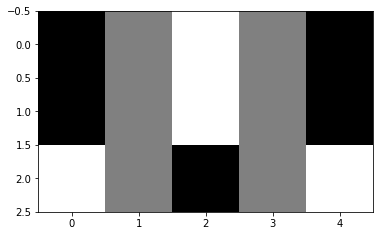

In [ ]:
plt.imshow(test,cmap='gray')

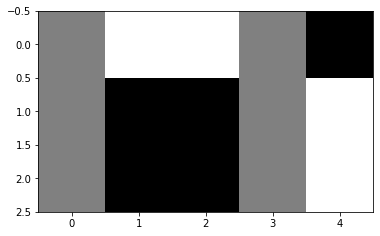

In [ ]:
plt.imshow(np.fft.fftshift(test),cmap='gray')

## Scaler

In [ ]:
# Sclae methods
# method 1
def minMaxScaler(X,min=0,max=255):
  X = X.astype("float")
  X_std = (X - X.min()) / (X.max() - X.min())
  X_scaled = X_std * (max - min) + min
  return X_scaled


# method 2
# audio /= np.max(np.abs(audio),axis=0)
def mmscaler(X):
  X = X.astype("float")
  X -= X.min()
  X *= (255.0/X.max())
  return X

In [ ]:
import pandas as pd
pd.Series(np.ravel(minMaxScaler(X)==mmscaler(X))).value_counts()

True     97634
False    77470
dtype: int64

In [ ]:
 # method 3
cv2_norm_x = cv2.normalize(X, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX) #dtype=cv2.CV_8U
cv2_norm_x.mean(), minMaxScaler(X).mean(), mmscaler(X).mean()

(106.82662496122745, 106.82662496122747, 106.82662496122745)

In [ ]:
cv2_norm_x.std(), minMaxScaler(X).std(), mmscaler(X).std()

(12.797926844361513, 12.797926844361516, 12.797926844361513)

In [ ]:
cv2_norm_x.sum(), minMaxScaler(X).sum(), mmscaler(X).sum()

(18705769.33721077, 18705769.337210774, 18705769.33721077)

## Metrics 

In [ ]:
# MSE
from sklearn.metrics import mean_squared_error
mean_squared_error(minMaxScaler(img),minMaxScaler(img_orig))

1637.0098710294849

In [ ]:
def mse(img_1, img_2):
  return np.sum((img_1-img_2) ** 2)/(img_1.shape[0]*img_1.shape[1])
mse(minMaxScaler(img),minMaxScaler(img_orig))

1637.0098710294849

In [ ]:
mean_squared_error(mmscaler(img), mmscaler(img_orig))

1637.0098710294847

In [ ]:
#SSIM
from skimage.metrics import structural_similarity as ssim
ssim(minMaxScaler(img), minMaxScaler(img_orig))

0.08652972931865052

In [ ]:
mse(img, img_orig),ssim(img, img_orig)

(1731.1934450383771, 0.08723530472026)

## Show FFT


In [ ]:
c_magnitude_spectrum.min(),c_magnitude_spectrum.max()

(3.514171990958876, 17.166377994701186)

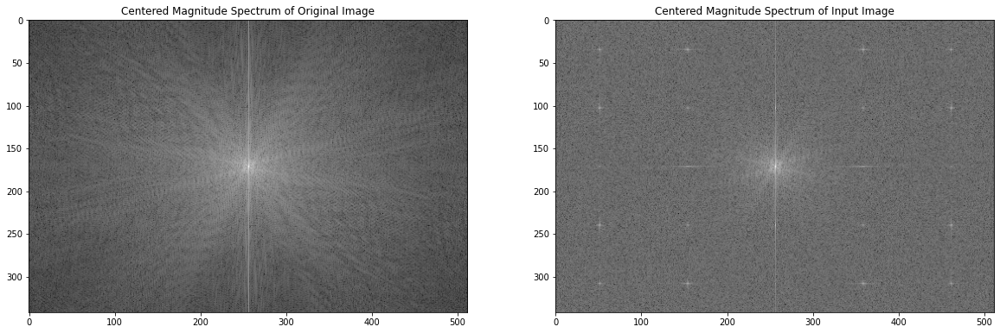

In [ ]:
def get_cfft_mag(img):
  f = np.fft.fft2(img)
  fshift = np.fft.fftshift(f)
  c_magnitude_spectrum = np.log(np.abs(fshift)) # log transform
  return c_magnitude_spectrum

plt.figure(figsize=(20, 15))
plt.subplot(221),plt.imshow(get_cfft_mag(img_orig), cmap = 'gray')
plt.title('Centered Magnitude Spectrum of Original Image')
plt.subplot(222),plt.imshow(get_cfft_mag(img), cmap = 'gray')
plt.title('Centered Magnitude Spectrum of Input Image')
plt.show()


## Low Pass Filtering

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log


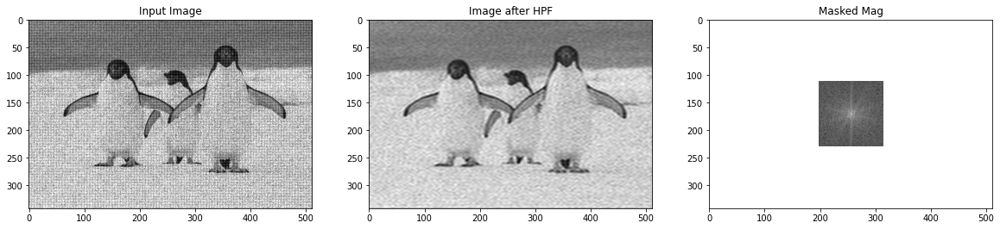

(258.9219539898739, 0.17500840392528308)

In [ ]:
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)
mask_size = 60
mask = np.zeros((row,col),np.uint8)
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 1
fshift_mask = fshift * mask

f_ishift = np.fft.ifftshift(fshift_mask)
img_low = np.fft.ifft2(f_ishift)
# img_low = np.log(np.abs(img_low)) #log tansform

img_low = minMaxScaler(img_low)
img = minMaxScaler(img)

plt.figure(figsize=(20, 15))
plt.subplot(131),plt.imshow(img, cmap = 'gray')
plt.title('Input Image')
plt.subplot(132),plt.imshow(img_low, cmap = 'gray')
plt.title('Image after HPF')
plt.subplot(133),plt.imshow(np.log(np.abs(fshift_mask)), cmap='gray')
plt.title('Masked Mag')
plt.show()
mse(minMaxScaler(img_orig),img_low),ssim(minMaxScaler(img_orig),img_low)

## Band Pass

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log


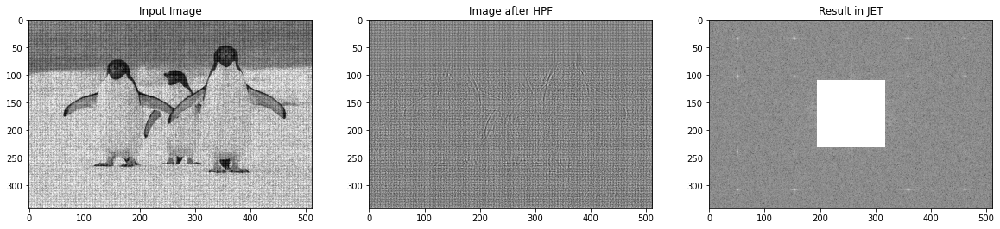

In [ ]:
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)
mask_size = 60
comp_size = 0

mask = np.ones((row,col),np.uint8)
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 0
mask[row_c-comp_size:row_c+comp_size, col_c-comp_size:col_c+comp_size] = 1

fshift_mask = fshift * mask

f_ishift = np.fft.ifftshift(fshift_mask)
img_high = np.fft.ifft2(f_ishift)
# img_high = np.log(np.abs(img_high)) #log tansform

img_high = minMaxScaler(img_high)
img = minMaxScaler(img)

plt.figure(figsize=(20, 15))
plt.subplot(131),plt.imshow(img, cmap = 'gray')
plt.title('Input Image')
plt.subplot(132),plt.imshow(img_high, cmap = 'gray')
plt.title('Image after HPF')
plt.subplot(133),plt.imshow(np.log(np.abs(fshift_mask)), cmap='gray')
plt.title('Result in JET')
plt.show()

(257.1024207269491, 0.1758103433776389)

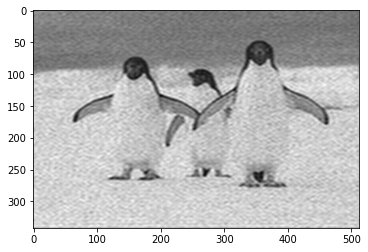

In [ ]:
plt.imshow(img-img_high, cmap = 'gray')
mse(minMaxScaler(img-img_high),minMaxScaler(img_orig)),ssim(minMaxScaler(img-img_high),minMaxScaler(img_orig))

## Use CV2
cv2's dft, same results

 First channel will have the real part of the result and second channel will have the imaginary part of the result. The input image should be converted to np.float32 first.
 频谱图可以不用log(abs())变化就能直接可视化，filter参数与numpy效果不同

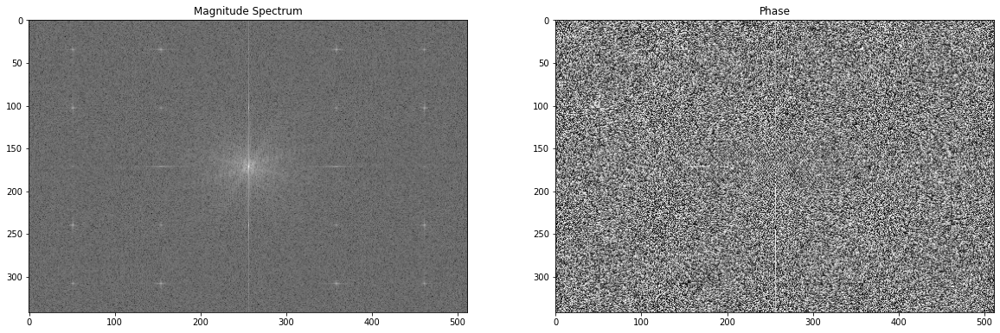

In [ ]:
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)# same to the np.fft.fft2
dft_shift = np.fft.fftshift(dft)
mag, phase = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1])

mag_spectrum = np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))  #log tansform

plt.figure(figsize=(20,15))
plt.subplot(121),plt.imshow(np.log(mag), cmap = 'gray')
plt.title('Magnitude Spectrum')
plt.subplot(122),plt.imshow(phase, cmap = 'gray')
plt.title('Phase')
plt.show()

7.555478840638986e-05


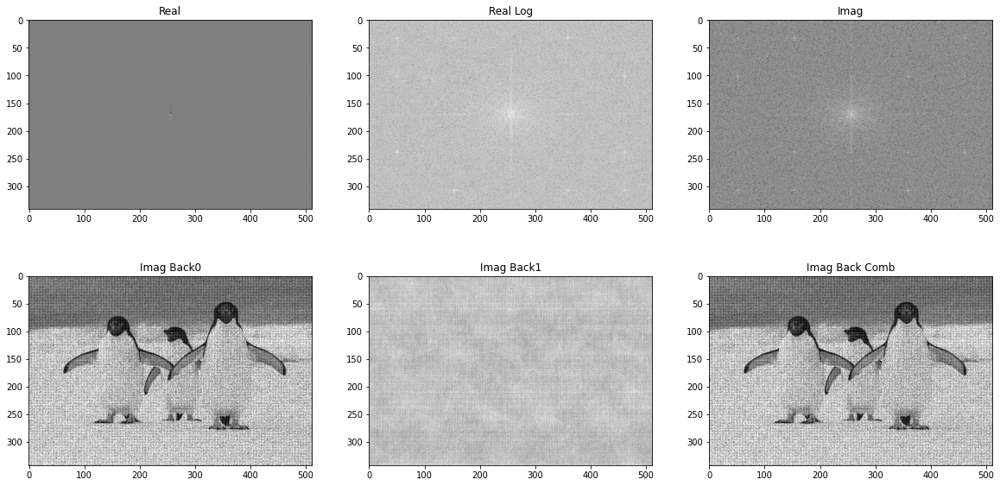

In [ ]:
mag, phase = cv2.cartToPolar(dft_shift[:,:,0], dft_shift[:,:,1]) # extract magnitude and phase images from centered fft
mag_spectrum = np.log(mag) # get spectrum for viewing only
# mag = cv2.pow(mag, 1.1) # values larger than 1 increase contrast; values smaller than 1 decrease contrast
real, imag = cv2.polarToCart(mag, phase) # convert magnitude and phase into cartesian real and imaginary components
back = cv2.merge([real, imag]) # combine cartesian components into one complex image
back_ishift = np.fft.ifftshift(back) # shift origin from center to upper left corner
img_back = cv2.idft(back_ishift) # do inverse dft saving as complex output
img_back_comb = cv2.magnitude(img_back[:,:,0], img_back[:,:,1]) # combine complex components into original image again
img_back_comb_scaled = cv2.normalize(img_back_comb, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
print(mse(img_back_comb_scaled,img))
plt.figure(figsize=(20,10))
plt.subplot(231),plt.imshow(real, cmap = 'gray')
plt.title('Real')
plt.subplot(232),plt.imshow(np.log(np.abs(real)), cmap = 'gray')
plt.title('Real Log')
plt.subplot(233),plt.imshow(np.log(np.abs(imag)), cmap = 'gray')
plt.title('Imag')
plt.subplot(234),plt.imshow(img_back[:,:,0], cmap = 'gray')
plt.title('Imag Back0')
plt.subplot(235),plt.imshow(img_back[:,:,1], cmap = 'gray')
plt.title('Imag Back1')
plt.subplot(236),plt.imshow(img_back_comb_scaled, cmap = 'gray')
plt.title('Imag Back Comb')
plt.show()

In [ ]:
mse(img_back[:,:,0],img_back_comb)  # Imag Back is different from Image Back Comb

110.80260873538012

In [ ]:
dft_ishift = np.fft.ifftshift(dft_shift)
img_same = cv2.idft(dft_ishift)
img_same_comb = cv2.magnitude(img_same[:,:,0],img_same[:,:,1])
mse(minMaxScaler(img_same_comb),minMaxScaler(img))

5.1737828108049375e-09

In [ ]:
mse(minMaxScaler(img_same[:,:,0]),minMaxScaler(img)),mse(minMaxScaler(img_same_comb),minMaxScaler(img))

(3.5855539442494883e-09, 5.1737828108049375e-09)

### CV2 LPF


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log


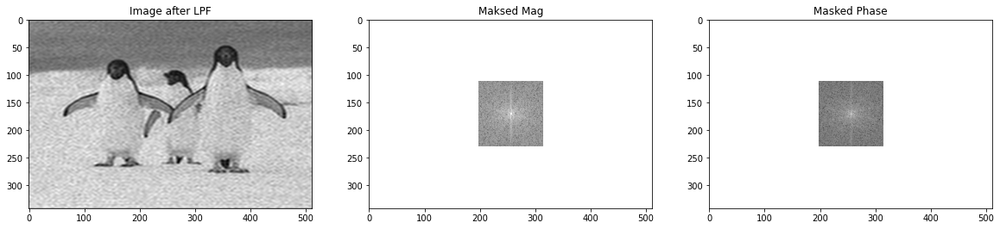

(245.03768450701583, 0.17529149948562475)

In [ ]:
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)

mask = np.zeros((row,col,2),np.uint8)
mask_size = 60
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 1

dft_shift_mask = dft_shift * mask
dft_ishift = np.fft.ifftshift(dft_shift_mask)

img_low = cv2.idft(dft_ishift)
img_low = cv2.magnitude(img_low[:,:,0],img_low[:,:,1])
img_low = minMaxScaler(img_low)
plt.figure(figsize=(20, 15))
plt.subplot(131),plt.imshow(img_low, cmap = 'gray')
plt.title('Image after LPF')
plt.subplot(132),plt.imshow(np.log(np.abs(dft_shift_mask[:,:,0])), cmap = 'gray')
plt.title('Maksed Mag')
plt.subplot(133),plt.imshow(np.log(np.abs(dft_shift_mask[:,:,1])), cmap = 'gray')
plt.title('Masked Phase')

plt.show()
mse(img_low,minMaxScaler(img_orig)),ssim(img_low,minMaxScaler(img_orig))

### CV2 HPF


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: divide by zero encountered in log


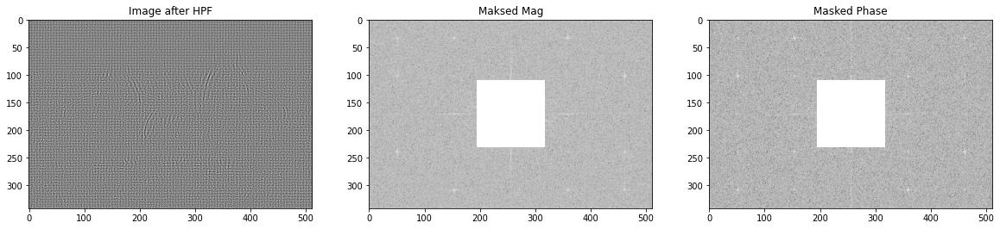

In [ ]:
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)

mask = np.ones((row,col,2),np.uint8)
mask_size = 60
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size] = [0,0]

dft_shift_mask = dft_shift * mask
dft_ishift = np.fft.ifftshift(dft_shift_mask)

img_high1 = cv2.idft(dft_ishift)

# img_high1 = cv2.magnitude(img_high1[:,:,0],img_high1[:,:,1])
img_high1 = minMaxScaler(img_high1[:,:,0])

plt.figure(figsize=(20, 15))
plt.subplot(131),plt.imshow(img_high1, cmap = 'gray')
plt.title('Image after HPF')
plt.subplot(132),plt.imshow(np.log(np.abs(dft_shift_mask[:,:,0])), cmap = 'gray')
plt.title('Maksed Mag')
plt.subplot(133),plt.imshow(np.log(np.abs(dft_shift_mask[:,:,1])), cmap = 'gray')
plt.title('Masked Phase')
plt.show()

(257.1024852557398, 0.17581033968317203)

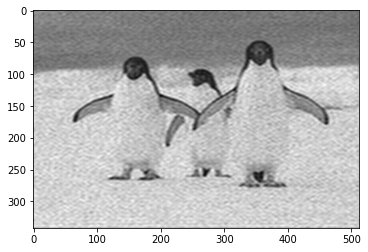

In [ ]:
plt.imshow(minMaxScaler(img-img_high1), cmap = 'gray')
mse(minMaxScaler(img-img_high1),minMaxScaler(img_orig)),ssim(minMaxScaler(img-img_high1),minMaxScaler(img_orig))

### CV2 Band reject

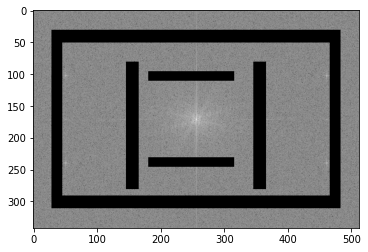

In [ ]:
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)
mask = np.ones((row,col),np.uint8)

mask[row_c-140:row_c+140, col_c-227:col_c+227] = 0
mask[row_c-120:row_c+120, col_c-210:col_c+210] = 1

mask_size = 110
comp_size = 90
mask[row_c-mask_size+20:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 0
mask[row_c-comp_size:row_c+comp_size+20, col_c-comp_size:col_c+comp_size] = 1
mask_size = 75
comp_size = 60
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size-15] = 0
mask[row_c-comp_size:row_c+comp_size, col_c-comp_size-15:col_c+comp_size] = 1

plt.imshow(mask*mag_spectrum,cmap='gray')

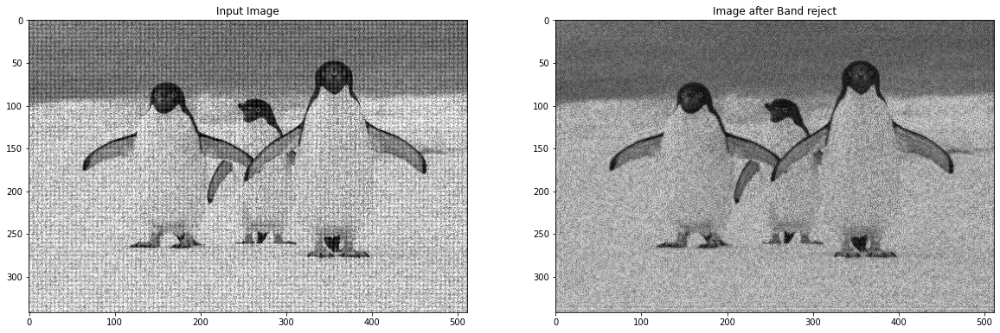

(1964.3671261375407, 0.10392373537792987)

In [ ]:
row, col = img.shape
row_c, col_c = int(row/2), int(col/2)

mask = np.ones((row,col,2),np.uint8)

mask[row_c-140:row_c+140, col_c-227:col_c+227] = 0
mask[row_c-120:row_c+120, col_c-210:col_c+210] = 1

mask_size = 110
comp_size = 90
mask[row_c-mask_size+20:row_c+mask_size, col_c-mask_size:col_c+mask_size] = 0
mask[row_c-comp_size:row_c+comp_size+20, col_c-comp_size:col_c+comp_size] = 1
mask_size = 75
comp_size = 60
mask[row_c-mask_size:row_c+mask_size, col_c-mask_size:col_c+mask_size-15] = 0
mask[row_c-comp_size:row_c+comp_size, col_c-comp_size-15:col_c+comp_size] = 1

dft_shift_mask = dft_shift * mask
dft_ishift = np.fft.ifftshift(dft_shift_mask)

img_band = cv2.idft(dft_ishift)
img_band = cv2.magnitude(img_band[:,:,0],img_band[:,:,1])


plt.figure(figsize=(20, 15))
plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image')
plt.subplot(122),plt.imshow(img_band, cmap = 'gray')
plt.title('Image after Band reject')
plt.show()
mse(minMaxScaler(img_band),minMaxScaler(img_orig)),ssim(minMaxScaler(img_band),minMaxScaler(img_orig))

In [ ]:
mse(minMaxScaler(img_band),img_orig),ssim(minMaxScaler(img_band),img_orig)

(1861.589126213253, 0.10396777102829319)

### Test Notch Filter


In [ ]:
mag_spectrum.mean(),mag_spectrum.max()

(9.233462, 17.166378)

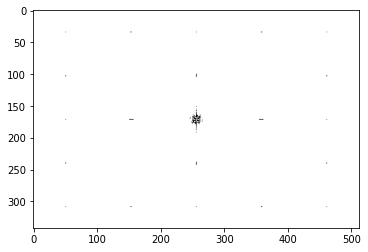

In [ ]:
mask_notch = [[0 if i > 12 and i < 14 else 1 for i in r] for r in mag_spectrum]  # 9,13 pure peroid noise+low, 9,15 pure white noise
# 10,13 peroid noise + edges, 10,14 white noise+edges
# 11,14 white noise + edges
# 12,14 remove most period noise, white noise+orig
plt.imshow(mask_notch, cmap = 'gray')

In [ ]:
mask_notch = np.array(mask_notch).reshape(342, 512, -1)
mask_notch = np.concatenate([mask_notch,mask_notch],axis=2)
mask_notch.shape

(342, 512, 2)

3706.619226542681


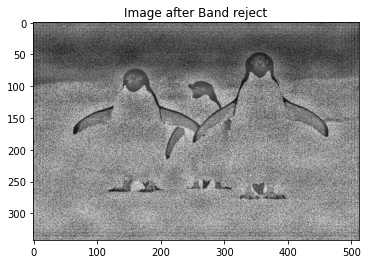

In [ ]:
dft_shift_mask = dft_shift * mask_notch
dft_ishift = np.fft.ifftshift(dft_shift_mask)

img_band1 = cv2.idft(dft_ishift)
img_band1 = cv2.magnitude(img_band1[:,:,0],img_band1[:,:,1])
img_band1 = minMaxScaler(img_band1)
print(mse(img_band1,img_orig))
# plt.figure(figsize=(20, 15))
plt.imshow(img_band1, cmap = 'gray')
plt.title('Image after Band reject')
plt.show()

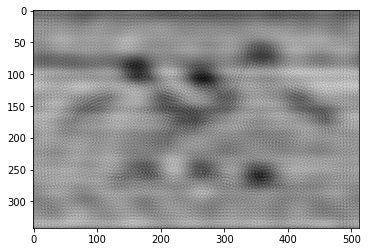

In [ ]:
# plt.imshow(img_band, cmap = 'gray')
plt.imshow(minMaxScaler(img_band)-minMaxScaler(img_band1), cmap = 'gray')

### Wavelet 

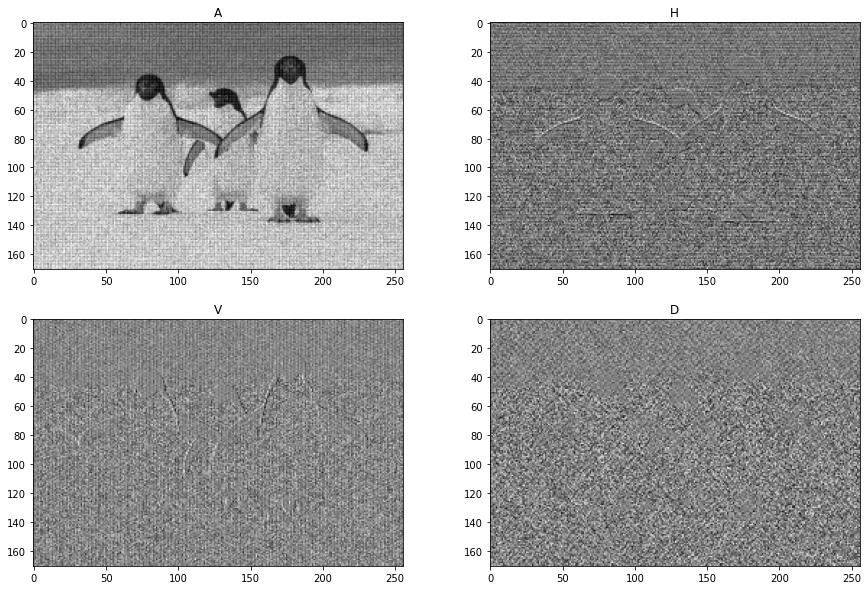

In [ ]:
# 2D Discrete Wavelet Transform
import pywt
coeffs = pywt.dwt2(img, 'haar')
cA, (cH, cV, cD) = coeffs
plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(cA, 'gray'), plt.title("A")
plt.subplot(222), plt.imshow(cH, 'gray'), plt.title("H")
plt.subplot(223), plt.imshow(cV, 'gray'), plt.title("V")
plt.subplot(224), plt.imshow(cD, 'gray'), plt.title("D")
plt.show()

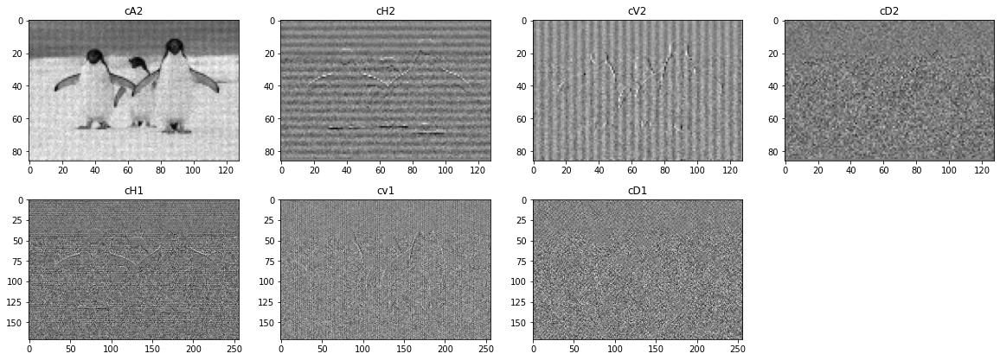

In [ ]:
# Multilevel 2D Discrete Wavelet Transform
coeffs_2 = pywt.wavedec2(img, 'haar', level=2)
cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs_2
plt.figure(figsize=(20,7))
plt.subplot(241), plt.imshow(cA2, 'gray'), plt.title("cA2")
plt.subplot(242), plt.imshow(cH2, 'gray'), plt.title("cH2")
plt.subplot(243), plt.imshow(cV2, 'gray'), plt.title("cV2")
plt.subplot(244), plt.imshow(cD2, 'gray'), plt.title("cD2")
plt.subplot(245), plt.imshow(cH1, 'gray'), plt.title("cH1")
plt.subplot(246), plt.imshow(cV1, 'gray'), plt.title("cv1")
plt.subplot(247), plt.imshow(cD1, 'gray'), plt.title("cD1")
plt.show()


## Smoothing

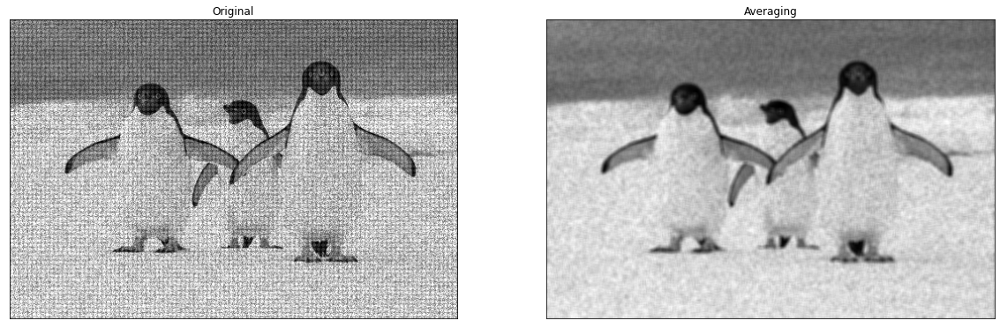

(143.94188405704733, 0.2049438881115271)

In [ ]:
# Average
kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(img,-1,kernel)

plt.figure(figsize=(20,12))
plt.subplot(121),plt.imshow(img, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst, cmap='gray'),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()
# mse(dst,img_orig),ssim(dst,img_orig)
mse(minMaxScaler(dst),minMaxScaler(img_orig)),ssim(minMaxScaler(dst),minMaxScaler(img_orig))

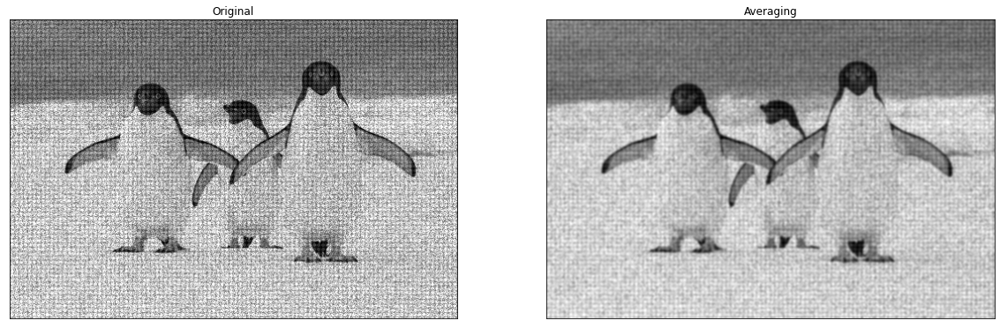

(288.836247674326, 0.1552099868387101)

In [ ]:
# Gaussian Filtering
plt.figure(figsize=(20, 12))
blur = cv2.GaussianBlur(img,(5,5),0)

plt.subplot(121),plt.imshow(img, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur, cmap='gray'),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()
mse(minMaxScaler(blur),minMaxScaler(img_orig)),ssim(minMaxScaler(blur),minMaxScaler(img_orig))

In [ ]:
# Median
blur = cv2.medianBlur(img,5)

plt.figure(figsize=(20, 12))
plt.subplot(121),plt.imshow(img, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur, cmap='gray'),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()
mse(minMaxScaler(blur),minMaxScaler(img_orig)),ssim(minMaxScaler(blur),minMaxScaler(img_orig))

(831.8531178734074, 0.1298724146680717)

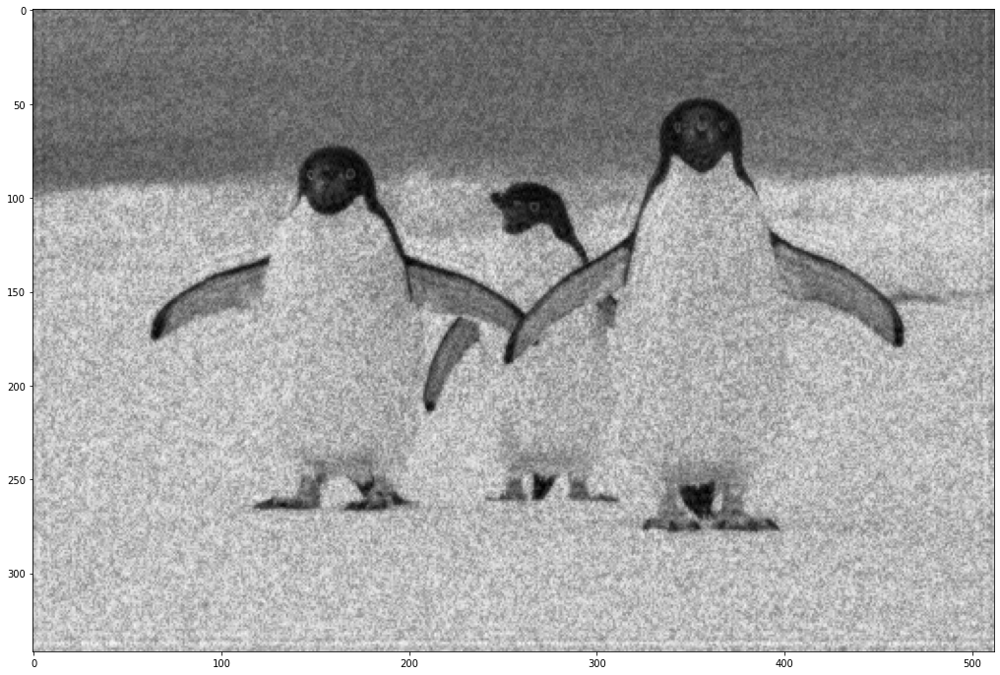

In [ ]:
# Bilateral Filtering
# https://www.programcreek.com/python/example/89365/cv2.bilateralFilter
blur_bil = cv2.bilateralFilter(img_band,9,100,100)
blur_ga =  cv2.GaussianBlur(blur_bil, (3, 3), 0, 0)
img_smooth = np.minimum(0.8 * blur_ga + (1 - 0.8) * img_band, 255).astype('uint8')
plt.figure(figsize=(20, 12))
plt.imshow(blur_bil+blur_ga, cmap = 'gray')
mse(minMaxScaler(blur_bil+blur_ga),minMaxScaler(img_orig)),ssim(minMaxScaler(blur_bil+blur_ga),minMaxScaler(img_orig))

(1321.696777266717, 0.11436499971272143)

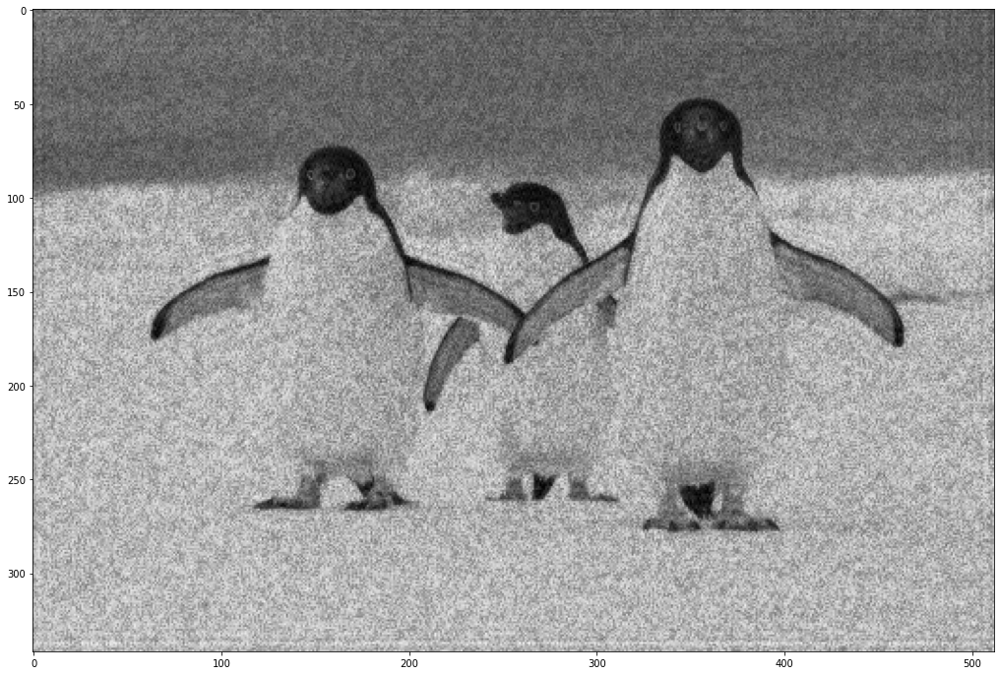

In [ ]:
g_blur = cv2.GaussianBlur(blur,(5,5),0)
g_blur = cv2.medianBlur((g_blur+img_band)/2,5,0)
plt.figure(figsize=(20, 12))
plt.imshow((2*img_band+g_blur), cmap='gray')
mse(minMaxScaler(2*img_band+g_blur),minMaxScaler(img_orig)),ssim(minMaxScaler(2*img_band+g_blur),minMaxScaler(img_orig))

In [ ]:
import pickle
output = 2*img_band+g_blur
with open(f'{PATH}outputImg.pickle', 'wb') as handle:
    pickle.dump(output, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
type(output)

numpy.ndarray

## Laplacian HPF

In [ ]:
x = cv2.getGaussianKernel(5,10)
x*x.T

array([[0.0392052 , 0.03979772, 0.0399972 , 0.03979772, 0.0392052 ],
       [0.03979772, 0.04039918, 0.04060168, 0.04039918, 0.03979772],
       [0.0399972 , 0.04060168, 0.0408052 , 0.04060168, 0.0399972 ],
       [0.03979772, 0.04039918, 0.04060168, 0.04039918, 0.03979772],
       [0.0392052 , 0.03979772, 0.0399972 , 0.03979772, 0.0392052 ]])

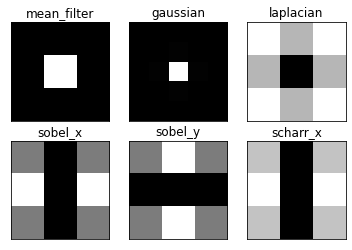

In [ ]:
# simple averaging filter without scaling parameter
mean_filter = np.ones((3,3))

# creating a guassian filter
x = cv2.getGaussianKernel(5,10)
gaussian = x*x.T

# different edge detecting filters
# scharr in x-direction
scharr = np.array([[-3, 0, 3],
                   [-10,0,10],
                   [-3, 0, 3]])
# sobel in x direction
sobel_x= np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])
# sobel in y direction
sobel_y= np.array([[-1,-2,-1],
                   [0, 0, 0],
                   [1, 2, 1]])
# laplacian
laplacian=np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])

filters = [mean_filter, gaussian, laplacian, sobel_x, sobel_y, scharr]
filter_name = ['mean_filter', 'gaussian','laplacian', 'sobel_x', \
                'sobel_y', 'scharr_x']
fft_filters = [np.fft.fft2(x) for x in filters]
fft_shift = [np.fft.fftshift(y) for y in fft_filters]
mag_spectrum = [np.log(np.abs(z)+1) for z in fft_shift]

for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(mag_spectrum[i],cmap = 'gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])

plt.show()

## FDA Tool

In [ ]:
!pyfdax

Created logging directory /var/log/.pyfda
Creating config directory 
'/root/.pyfda'
Config file "/root/.pyfda/pyfda.conf" doesn't exist yet, creating it.
Logging config file /root/.pyfda/pyfda_log.conf doesn't exist yet, creating it.
Traceback (most recent call last):
  File "/usr/local/bin/pyfdax", line 5, in <module>
    from pyfda.pyfdax import main
  File "/usr/local/lib/python3.6/dist-packages/pyfda/pyfdax.py", line 24, in <module>
    matplotlib.use("Qt5Agg")
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/deprecation.py", line 296, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/deprecation.py", line 358, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/__init__.py", line 1281, in use
    plt.switch_backend(name)
  File "/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py", line 237, in switch_backend
    newbackend, required_framework, current